# The stability of the global average on different window lengths
This notebook outllines different methods that can be used to de-trend the LongRunMIP and ZECMIP time series.

# Imports

In [24]:
import nc_time_axis
import warnings
from itertools import groupby
import xarray as xr
import numpy as np
import pandas as pd
from importlib import reload
from numba import njit
from scipy.stats import spearmanr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.gridspec as gridspec 
from matplotlib.axes import Axes
import matplotlib as mpl
import time
import xesmf
import os
import sys
import string
from enum import Enum
from numpy.typing import ArrayLike
from typing import Optional, Callable, List, Tuple, Dict

from itertools import groupby

warnings.filterwarnings('ignore')

In [4]:
sys.path.append(os.path.join(os.getcwd(), 'Documents/PhD'))

In [214]:
import constants
from constants import PlotConfig
sys.path.append(constants.MODULE_DIR)
import sn_plotting
import xarray_class_accessors as xca
import utils
import stats
import xarray_extender as xce
import signal_to_noise as sn
import open_ds
from classes import ExperimentTypes, LocationsLatLon
import plotting_functions
import xarray_extender as xe
import classes
logger = utils.get_notebook_logger()

In [6]:
notebook_number='01'

In [7]:
%matplotlib inline

In [8]:
# import dask.distributed as dd
# import tempfile

# tempdir = tempfile.TemporaryDirectory("dask-worker-space")
# dd.Client(local_directory=tempdir.name, memory_limit='20gb')

# Loading Data

In [9]:
experiment_params = constants.EXPERIMENTS_TO_RUN[0]
experiment_params

{'variable': 'tas', 'mask': None, 'hemisphere': 'global'}

In [10]:
constants.ZECMIP_LOCAL_REGRIDDED_DIR,

('/g/data/w40/ab2313/PhD/zecmip/regridded',)

In [11]:
experiment_zec_da = open_ds.open_mfdataset_nc(os.path.join(constants.ZECMIP_LOCAL_REGRIDDED_DIR, 'A1'), 
                                              to_array=False).tas
picontrol_zec_da = open_ds.open_mfdataset_nc(os.path.join(constants.ZECMIP_LOCAL_REGRIDDED_DIR, 'picontrol'),
                                             to_array=False).tas

In [12]:
SN_DIR = os.path.join(constants.ZECMIP_LOCAL_REGRIDDED_DIR, 'signal_to_noise')
SN_DIR

'/g/data/w40/ab2313/PhD/zecmip/regridded/signal_to_noise'

In [13]:
local_signal_to_noise_files = [f for f in  os.listdir(SN_DIR) if 'A1' not in f]
local_signal_to_noise_files

['exp_rolling_noise_False.nc',
 'over_commit',
 'control_rolling_noise_False.nc',
 'control_rolling_noise_True.nc',
 'exp_rolling_noise_True.nc']

In [14]:
exp_rolling_noise_True = xr.open_dataset(os.path.join(SN_DIR, 'exp_rolling_noise_True.nc'))
control_rolling_noise_True = xr.open_dataset(os.path.join(SN_DIR, 'control_rolling_noise_True.nc')
                                            ).isel(time=slice(1,100)).chunk({'time':-1, 'lat':-1})

In [15]:
mask_ds = xr.open_dataset(os.path.join(constants.ZECMIP_LOCAL_REGRIDDED_DIR, 'landsea_mask.nc')); mask_ds

<xarray.Dataset>
Dimensions:  (lat: 96, lon: 192)
Coordinates:
  * lat      (lat) float64 -88.57 -86.72 -84.86 -83.0 ... 83.0 84.86 86.72 88.57
  * lon      (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
Data variables:
    mask     (lat, lon) int64 ...
Attributes:
    Original model:  Made from data found at /g/data/oi10/replicas/CMIP6/C4MI...

# Local

## Calculations

In [16]:
def calculate_and_add_upper_and_lower_bound(ds:xr.Dataset, control_ds:xr.Dataset)->xr.Dataset:
    '''
    Takes the picontrol from a run and also the experiment in questions. The upper and lower bound 
    are calculated and added to the dataset
    '''
    control__lbound, control__ubound = sn.calculate_upper_and_lower_bounds(control_ds.signal_to_noise,
                                                                           logginglevel='INFO')
    
    ds_w_bounds = xe.add_lower_upper_to_dataset(ds.signal_to_noise,
                                                control__lbound, control__ubound)
    return ds_w_bounds

In [56]:
unstable_sn_ds = exp_local_sn_rolling_ds.utils.above_or_below(
            'signal_to_noise', greater_than_var = 'upper_bound', less_than_var = 'lower_bound').signal_to_noise;
unstable_sn_ds

<xarray.DataArray 'signal_to_noise' (window: 2, time: 100, model: 8, lat: 96,
                                     lon: 192)>
dask.array<where, shape=(2, 100, 8, 96, 192), dtype=float64, chunksize=(2, 100, 8, 96, 192), chunktype=numpy.ndarray>
Coordinates:
  * time      (time) object 0001-12-31 00:00:00 ... 0100-12-31 00:00:00
  * lat       (lat) float64 -88.57 -86.72 -84.86 -83.0 ... 84.86 86.72 88.57
  * lon       (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
  * model     (model) object 'CESM2' 'CanESM5' ... 'NorESM2-LM' 'UKESM1-0-LL'
  * window    (window) int64 21 41
    height    float64 2.0
    variable  <U3 'tas'

In [17]:
exp_local_sn_rolling_ds = calculate_and_add_upper_and_lower_bound(exp_rolling_noise_True,control_rolling_noise_True).persist()

- Calculating Upper and lower control bounds
- Map blocks used


In [154]:
stable_unstable_args_da = sn.find_stable_and_unstable_years(unstable_sn_ds)
stable_unstable_args_da.name = 'time'
stable_unstable_args_da

<xarray.DataArray 'time' (window: 2, stability: 2, arg: 4, model: 8, lat: 96,
                          lon: 192)>
array([[[[[[ 0.,  0.,  0., ...,  0.,  0.,  0.],
           [ 0.,  0.,  0., ...,  0.,  0.,  0.],
           [ 0.,  0.,  0., ...,  0.,  0.,  0.],
           ...,
           [ 5.,  5.,  5., ...,  5.,  5.,  5.],
           [11., 11.,  8., ..., 11., 11., 11.],
           [11., 11., 11., ..., 11., 11., 11.]],

          [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
           [ 0.,  0.,  0., ...,  0.,  0.,  0.],
           [ 0.,  0.,  0., ...,  0.,  0.,  0.],
           ...,
           [ 8.,  8.,  8., ...,  8.,  8.,  8.],
           [ 8.,  8.,  8., ...,  8.,  8.,  8.],
           [ 8.,  8.,  8., ...,  8.,  8.,  8.]],

          [[ 6.,  6.,  6., ...,  6.,  6.,  6.],
           [ 4.,  4.,  4., ...,  4.,  4.,  4.],
           [ 3.,  3.,  3., ...,  3.,  3.,  3.],
           ...,
...
           ...,
           [nan, nan, nan, ..., nan, nan, nan],
           [nan, nan, nan, ..., nan, nan, nan],
           [nan, nan, nan, ..., nan, nan, nan]],

          [[nan, nan, nan, ..., nan, nan, nan],
           [nan, nan, nan, ..., nan, nan, nan],
           [nan, nan, nan, ..., nan, nan, nan],
           ...,
           [nan, nan, nan, ..., nan, nan, nan],
           [nan, nan, nan, ..., nan, nan, nan],
           [nan, nan, nan, ..., nan, nan, nan]],

          [[nan, nan, nan, ..., nan, nan, nan],
           [nan, nan, nan, ..., nan, nan, nan],
           [nan, nan, nan, ..., nan, nan, nan],
           ...,
           [nan, nan, nan, ..., nan, nan, nan],
           [nan, nan, nan, ..., nan, nan, nan],
           [nan, nan, nan, ..., nan, nan, nan]]]]]])
Coordinates:
  * lat        (lat) float64 -88.57 -86.72 -84.86 -83.0 ... 84.86 86.72 88.57
  * lon        (lon) float64 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
  * model      (model) object 'CESM2' 'CanESM5' ... 'NorESM2-LM' 'UKESM1-0-LL'
  * window     (window) int64 21 41
    height     float64 2.0
    variable   <U3 'tas'
  * arg        (arg) int64 0 1 2 3
  * stability  (stability) <U8 'stable' 'unstable'

In [155]:
# Fraction of models stable at each time.
rolling_year_stable_local = sn.get_stable_year_ds(exp_local_sn_rolling_ds, max_effective_length=50).persist()

Replacing points greater than 50 with 50


In [156]:
rollling_year_stable_local_average = xe.get_average_and_uncertainty_across_dim(
    rolling_year_stable_local, 'model', averaging_method='mean', uncertainty_method='max_min').squeeze()

rollling_year_stable_local_average

- averaging_method='mean', uncertainty_method='max_min'


<xarray.Dataset>
Dimensions:        (lat: 96, lon: 192, window: 2)
Coordinates:
  * lat            (lat) float64 -88.57 -86.72 -84.86 ... 84.86 86.72 88.57
  * lon            (lon) float64 0.0 1.875 3.75 5.625 ... 354.4 356.2 358.1
  * window         (window) int64 21 41
    height         float64 2.0
    variable       <U15 'signal_to_noise'
Data variables:
    average_value  (window, lat, lon) float64 dask.array<chunksize=(1, 96, 192), meta=np.ndarray>
    uncertainty    (window, lat, lon) float64 dask.array<chunksize=(1, 96, 192), meta=np.ndarray>

In [157]:
experiment_zec_da_anom = experiment_zec_da - experiment_zec_da.isel(time=slice(None, 10)).mean(dim='time')

In [158]:
stable_anom_da = sn.get_stabel_average_anomaly_over_windows(
    experiment_zec_da_anom,rolling_year_stable_local.time).persist().chunk('auto'); stable_anom_da

<function get_stable_average_anomaly_lat_lon at 0x7f8abd0840d0>


<xarray.DataArray 'temp' (window: 2, model: 8, lat: 96, lon: 192)>
dask.array<rechunk-merge, shape=(2, 8, 96, 192), dtype=float64, chunksize=(2, 8, 96, 192), chunktype=numpy.ndarray>
Coordinates:
  * lat       (lat) float64 -88.57 -86.72 -84.86 -83.0 ... 84.86 86.72 88.57
  * lon       (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
  * model     (model) object 'CESM2' 'CanESM5' ... 'NorESM2-LM' 'UKESM1-0-LL'
  * window    (window) int64 21 41
    height    float64 2.0
    variable  <U15 'signal_to_noise'

In [159]:
gradient_da = stable_anom_da/(rolling_year_stable_local.time.squeeze()+1)
gradient_da = xr.where(gradient_da==np.inf, 0, gradient_da)
gradient_da

<xarray.DataArray (window: 2, model: 8, lat: 96, lon: 192)>
dask.array<where, shape=(2, 8, 96, 192), dtype=float64, chunksize=(1, 8, 96, 192), chunktype=numpy.ndarray>
Coordinates:
  * lat       (lat) float64 -88.57 -86.72 -84.86 -83.0 ... 84.86 86.72 88.57
  * lon       (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
  * model     (model) object 'CESM2' 'CanESM5' ... 'NorESM2-LM' 'UKESM1-0-LL'
  * window    (window) int64 21 41
    height    float64 2.0
    variable  <U15 'signal_to_noise'

### Getting Percenet of Years Stable


The goal here is to convert all of the unstable points into nan values. So when the count function is used, only the finite values get counted, and we get the <b> percent of points that are stable </b>

In [160]:
stable_sn_da = sn.remove_all_unstable_points(exp_local_sn_rolling_ds.signal_to_noise.isel(time=slice(0,51)).squeeze(),                                           rolling_year_stable_local.time.squeeze())
stable_sn_da = stable_sn_da.isel(time=slice(0, 50))
stable_sn_da

21
41


<xarray.DataArray 'signal_to_noise' (window: 2, time: 50, model: 8, lat: 96,
                                     lon: 192)>
array([[[[[ 8.32275640e-01,  8.32237113e-01,  8.32954883e-01, ...,
            8.34381799e-01,  8.31371232e-01,  8.31537620e-01],
          [ 8.81559900e-01,  8.59602202e-01,  8.44505312e-01, ...,
            9.43969068e-01,  9.23312440e-01,  9.05387550e-01],
          [ 8.59913818e-01,  8.30995987e-01,  7.96242469e-01, ...,
            9.51248674e-01,  9.17553604e-01,  8.90228261e-01],
          ...,
          [            nan,             nan,             nan, ...,
                       nan,             nan,             nan],
          [            nan,             nan,             nan, ...,
                       nan,             nan,             nan],
          [            nan,             nan,             nan, ...,
                       nan,             nan,             nan]],

         [[-2.14837972e+00, -2.14796036e+00, -2.14823883e+00, ...,
           -2.17115908e+00, -2.16261694e+00, -2.15519216e+00],
          [-2.02949875e+00, -2.02595484e+00, -2.02590637e+00, ...,
           -2.04978053e+00, -2.04240466e+00, -2.03573137e+00],
          [-1.88500565e+00, -1.88120950e+00, -1.87996652e+00, ...,
           -1.87692435e+00, -1.88239320e+00, -1.88469693e+00],
...
          [-1.02485722e-01, -1.35599470e-01, -1.64338027e-01, ...,
            2.50560846e-02, -2.07770216e-02, -6.30318651e-02],
          [ 4.48307153e-03, -2.24410268e-02, -4.68215372e-02, ...,
            9.14264324e-02,  6.39606292e-02,  3.70812070e-02],
          [ 2.63024837e-01,  2.50966747e-01,  2.39395248e-01, ...,
            2.91643267e-01,  2.80575257e-01,  2.70218834e-01]],

         [[-1.53427215e-02, -1.14578468e-02, -8.93215556e-03, ...,
           -2.63616679e-02, -2.16313932e-02, -1.94568812e-02],
          [ 1.60420583e-01,  1.58469190e-01,  1.57114922e-01, ...,
            1.56585767e-01,  1.54462312e-01,  1.58100898e-01],
          [ 1.72644550e-01,  1.67951008e-01,  1.61553992e-01, ...,
            1.91523426e-01,  1.83361749e-01,  1.75882327e-01],
          ...,
          [            nan,             nan,             nan, ...,
                       nan,             nan,             nan],
          [ 2.86344547e-01,  3.10247976e-01,  3.32558395e-01, ...,
            2.37074383e-01,  2.50401707e-01,  2.65027852e-01],
          [ 8.36219858e-01,  8.44997273e-01,  8.53248284e-01, ...,
            7.99235838e-01,  8.12376822e-01,  8.25916186e-01]]]]])
Coordinates:
  * time      (time) object 0001-12-31 00:00:00 ... 0050-12-31 00:00:00
  * lat       (lat) float64 -88.57 -86.72 -84.86 -83.0 ... 84.86 86.72 88.57
  * lon       (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
  * model     (model) object 'CESM2' 'CanESM5' ... 'NorESM2-LM' 'UKESM1-0-LL'
  * window    (window) int64 21 41
    height    float64 ...
    variable  object ...

In [161]:
# out = np.arange(100).astype(float); out

# idx = np.arange(out.shape[0]); idx[:3]

# # first_stable_args = [30]
# # first_unstable_args = [50]
# # second_stable_args = [70]
# first_stable_args = [30]
# first_unstable_args = [np.nan]
# second_stable_args = [np.nan]

# out[idx < np.nan_to_num(first_stable_args, nan=99999)] = np.nan # Remove first unstalbe points - not to be counted
# out[np.logical_and(
#     idx < np.nan_to_num(first_unstable_args, nan=99999), # If re-stabilises, these are to be counted.
#     idx > np.nan_to_num(second_stable_args, nan=99999)
#                   )] = 1
# out[idx > np.nan_to_num(second_stable_args, nan=99999)] = np.nan # Has destabilised - not to be counted.

# out

In [162]:
stable_sn_da_advanced = sn.remove_unstable_years_advanced(
    exp_local_sn_rolling_ds.signal_to_noise.isel(time=slice(0,51)).transpose('time', 'window', 'model', 'lat', 'lon'),
    stable_unstable_args_da
    
    )

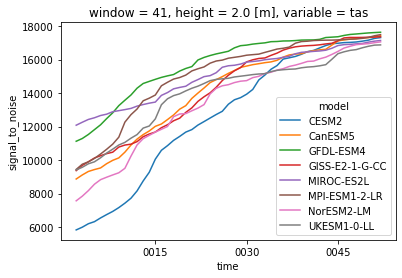

In [163]:
stable_sn_da_advanced.isel(window=1).count(dim=['lat', 'lon']).plot(x='time', hue='model')

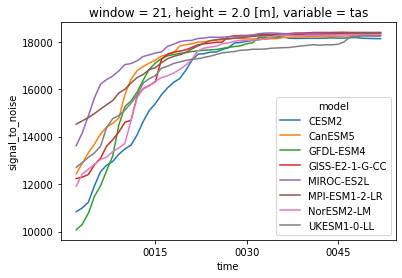

In [164]:
stable_sn_da_advanced.isel(window=0).count(dim=['lat', 'lon']).plot(x='time', hue='model')

## Plotting

### Percent of Year Stable

In [165]:
def calculate_all_regional_dataset(ds, mask_ds) -> dict:
    total_points = mask_ds.lat.size * mask_ds.lon.size
    total_land = mask_ds.mask.sum().values
    total_ocean = total_points - total_land
    # print(f'{total_points=} {total_land=} {total_ocean=}')
    
    stor_obj = {}
    stor_obj['gl'] = ds.count(dim=['lat', 'lon'])*100/total_points
    stor_obj['nh'] = ds.sel(lat=slice(0, None)).count(dim=['lat', 'lon'])*100/(total_points/2)
    stor_obj['sh'] = ds.sel(lat=slice(None, 0)).count(dim=['lat', 'lon'])*100/(total_points/2)
    
    stor_obj['land'] = ds.where(mask_ds.mask).count(dim=['lat', 'lon'])*100/total_land
    stor_obj['ocean'] = ds.where(mask_ds.mask==0).count(dim=['lat', 'lon'])*100/total_ocean
    
    total_tropics = mask_ds.sel(lat=slice(-23, 23)).lat.size * mask_ds.lon.size
    stor_obj['tropics'] = ds.sel(lat=slice(-23, 23)).count(dim=['lat', 'lon'])*100/total_tropics
    
    total_mid_lats = mask_ds.sel(lat=slice(-66, 66)).lat.size * mask_ds.lon.size
    stor_obj['mid_latitudes'] = ds.sel(lat=slice(-66, 66)).count(dim=['lat', 'lon'])*100/total_mid_lats

    total_arctic = mask_ds.sel(lat=slice(66, None)).lat.size * mask_ds.lon.size
    stor_obj['arctic'] = ds.sel(lat=slice(66, None)).count(dim=['lat', 'lon'])*100/total_arctic
    
    total_antarctic = mask_ds.sel(lat=slice(None, -66)).lat.size * mask_ds.lon.size
    stor_obj['antarctic'] = ds.sel(lat=slice(None, -66)).count(dim=['lat', 'lon'])*100/total_antarctic
    
    return stor_obj

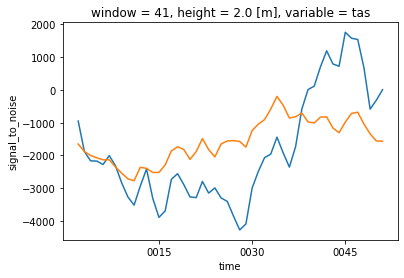

In [166]:
stable_sn_da.sel(window=21).sum(dim=['lat', 'lon']).mean(dim='model').plot()
stable_sn_da.sel(window=41).sum(dim=['lat', 'lon']).mean(dim='model').plot()

In [167]:
stor_obj = {21:  calculate_all_regional_dataset(stable_sn_da.sel(window=21), mask_ds),
            41: calculate_all_regional_dataset(stable_sn_da.sel(window=41), mask_ds)}
print(stor_obj.keys(), stor_obj[21].keys(), sep='\n')

dict_keys([21, 41])
dict_keys(['gl', 'nh', 'sh', 'land', 'ocean', 'tropics', 'mid_latitudes', 'arctic', 'antarctic'])


In [168]:
NAMING_MAP = dict(gl='Global', nh='Northern Hemisphere', sh='Southern Hemisphere', tropics='Tropics', land='Land', ocean='Ocean',
                 mid_latitudes='Mid Latitudes', arctic='Arctic', antarctic='Antarctic')

In [197]:
line_plot_kwargs = dict(xlabel='Time (Years)', labelpad=70, ncol=1, exp_type='zecmip', xlim=(0, 1))
left_kwargs = dict(add_legend=False, ylabel='Percent of\nPoints Stable (%)')

/home/563/ab2313/gdata/images/PhD/top_level/01_percent_points_stable_all_models_41.png


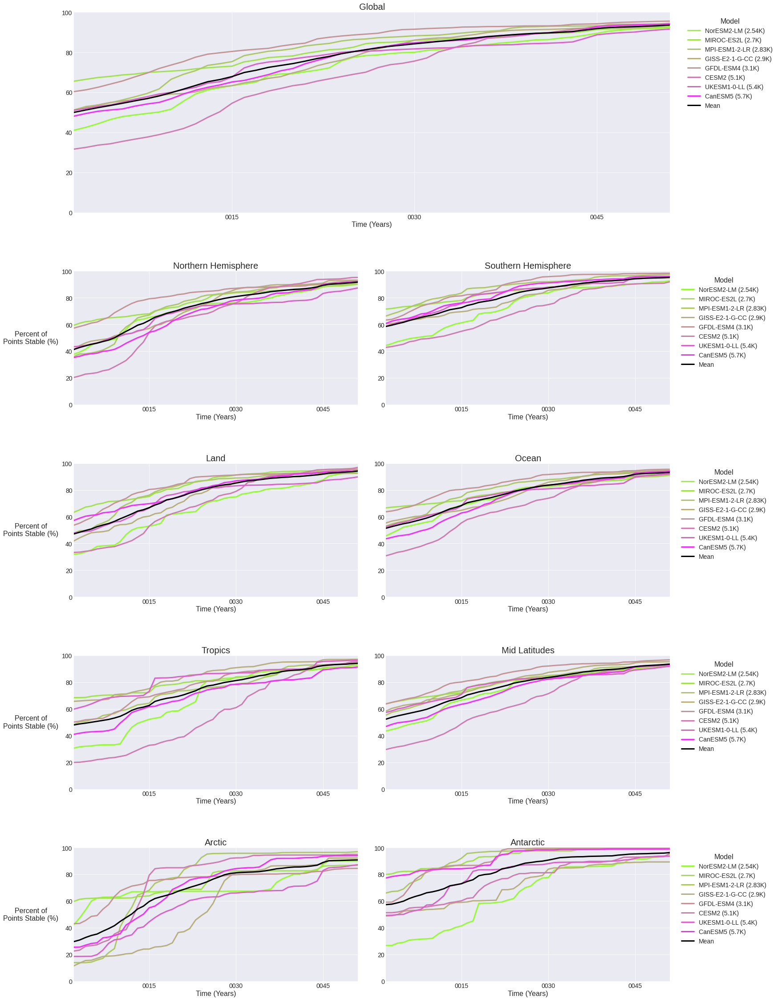

In [206]:
window = 41
plt.style.use('seaborn-darkgrid')
nplots = len(stor_obj[window])+1
fig = plt.figure(figsize=(12*2, 4*nplots))
gs = gridspec.GridSpec(int(np.ceil(nplots/2)), 2, height_ratios=[1.5] + [1]*int(np.ceil((nplots-2)/2)), wspace=0.1, hspace=0.4)
ax0 = fig.add_subplot(gs[0, :]); axes = [fig.add_subplot(gs[i+2]) for i in range(nplots-2)]
axes.insert(0, ax0)

for num, (reg, ds) in enumerate(stor_obj[window].items()):
    kwargs_to_use = left_kwargs if num%2 else {}
    sn_plotting.plot_all_coord_lines(ds, fig=fig, ax=axes[num], title=NAMING_MAP[reg], **kwargs_to_use, **line_plot_kwargs);
    axes[num].set_xlim([stable_sn_da.time.values[0], stable_sn_da.time.values[-1]]); axes[num].set_ylim(0, 100)

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, f'{notebook_number}_percent_points_stable_all_models_{window}.png'); print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight');

In [174]:
style_dict = {'gl':{'color':'black', 'linewidth':5, 'zorder':100},
              'land':{'color':'brown', 'linestyle':'--'}, 'ocean':{'color':'blue', 'linestyle':'--'},
              'nh':{'color':'yellow', 'linestyle':(0, (1,1))}, 'sh':{'color':'orange', 'linestyle':(0, (1,1))},
              'tropics':{'color':'darkgreen'}, 'mid_latitudes':{'color':'red'},
              'arctic':{'color':'lightblue'}, 'antarctic':{'color':'darkblue'}}

/home/563/ab2313/gdata/images/PhD/top_level/01_percent_points_stable.png


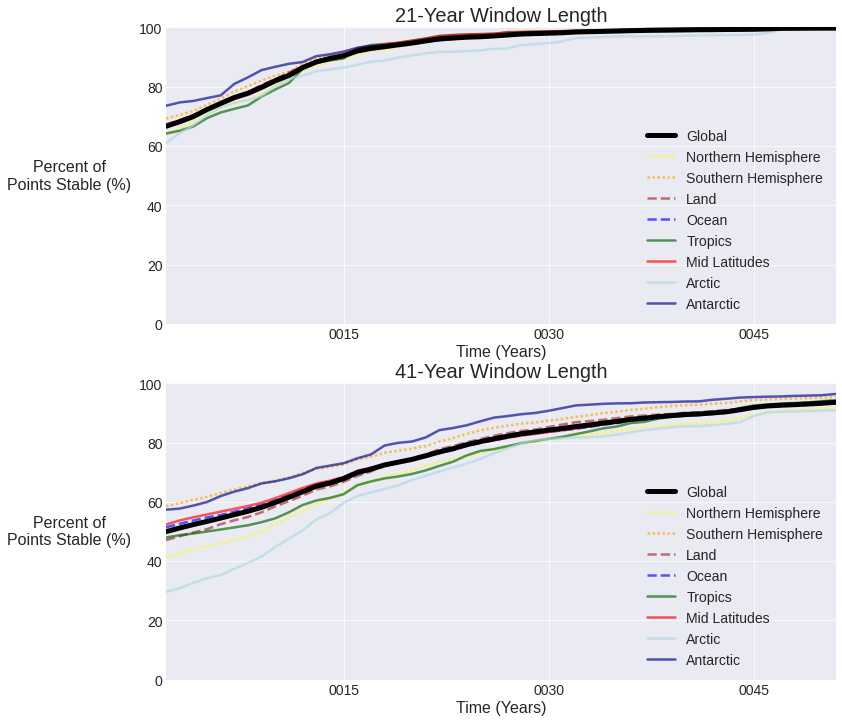

In [204]:
plt.style.use('seaborn-darkgrid')
fig, axes = plt.subplots(nrows=2, figsize=(12, 6*2))

base_style_dict = {'linewidth':2.5, 'alpha':0.65}
for num, reg in enumerate(stor_obj[41]):
    style = style_dict[reg]
    if reg != 'gl': style = dict(**base_style_dict, **style)
    stor_obj[21][reg].mean(dim='model').plot(ax=axes[0], label=NAMING_MAP[reg], **style)
    stor_obj[41][reg].mean(dim='model').plot(ax=axes[1], label=NAMING_MAP[reg], **style)

for ax, window in zip(axes, [21, 41]):
    ax.legend(fontsize=constants.PlotConfig.legend_text_size);
    ax.set_title(None); ax.set_ylim([0, 100])
    ax.set_xlim([stable_sn_da.time.values[0], stable_sn_da.time.values[-1]]);
    plotting_functions.format_axis(ax, ylabel='Percent of\nPoints Stable (%)', xlabel='Time (Years)', labelpad=70, title=f'{window}-Year Window Length');

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, f'{notebook_number}_percent_points_stable.png'); print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight');

### 1D Lat Lon Selection

In [207]:
def get_location_title(location: LocationsLatLon) -> str:
    lat,lon = location.value

    str_lat = str(abs(round(lat, 1)))
    str_lon = str(abs(round(lon, 1)))
    str_lat = str_lon + 'N' if lat > 0 else str_lon + 'S'
    str_lon = str_lon +'E' if lon > 0 else str_lon + 'W'
    location_name = location.name.replace('_', ' ').title()
    location_title = f'{location_name}'  + r' ({}, {})'.format(str_lat, str_lon)
    return location_title

In [208]:
def plot_single_point_all_models(ds, location: LocationsLatLon, length =50, start=0,
                                 fig=None, ax=None, legend_on: bool=True, bbox_to_anchor = [-0.03, 1],
                                ylabel=None, xlabel=None, ylim=None, linestyle=':'):
    lat,lon = location.value
    plt.style.use('seaborn-darkgrid')

    models = [model for model in list(constants.ZECMIP_MODEL_PARAMS) if model in ds.model.values]

    if fig is None: fig  = plt.figure(figsize=(10,8)); ax = fig.add_subplot(111)
        
    for model in models:
        da = (ds.sel(model=model)
              .isel(time=slice(start, length))
              .sel(lat=lat, lon=lon, method='nearest')
             )
        color = constants.ZECMIP_MODEL_PARAMS[model]['color']
        da.plot(ax=ax, label=model, linestyle=linestyle, color=color)
    if legend_on:
        leg = ax.legend()
        ax.legend(ncol=1, fontsize=15, bbox_to_anchor=bbox_to_anchor, frameon=True)
        leg.get_title().set_fontsize('15')
    ax.set_xlim(ds.time.values[start], ds.time.values[length])
    
    ax.set_title(get_location_title(location))
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    
    if ylabel: ax.set_ylabel(ylabel,fontsize = 16, rotation = 0, labelpad = 55)
    if xlabel: ax.set_xlabel(xlabel, fontsize=16)
    if ylim: ax.set_ylim(ylim)
        
    return fig, ax

In [209]:
def local_point_plot(values_ds, stable_values_ds, window, location, stable_points, fig=None, ax=None,
                    legend_on=True, ylabel=None, xlabel=None, ylim=None):

    fig, ax = plot_single_point_all_models(
        stable_values_ds.sel(window=window), location, fig=fig, ax=ax, linestyle='solid',
        legend_on=legend_on)

    plot_single_point_all_models(values_ds, location, fig=fig, ax=ax, legend_on=False,
      ylabel=f'{ylabel_name}\n{constants.VARIABLE_INFO[variable]["units"]}',
                                xlabel='Time (years)')

    for model, point in stable_points[window].items():
        color = color = constants.MODEL_PARAMS[model.lower()]['color']
        ax.scatter(point[0], point[1], zorder=100, color=color, edgecolor='k', s=25)
        
    if ylabel: ax.set_ylabel(ylabel,fontsize = 16, rotation = 0, labelpad = 55)
    if xlabel: ax.set_xlabel(xlabel, fontsize=16)
    if ylim:ax.set_ylim(ylim)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
        
    return fig, ax

In [242]:
def plot_lat_lon_value_and_sn(value_ds, sn_ds, stable_ds, location:classes.locationsLatLon2,
                              step=1, vmax=None, vmin=None, levels=None, vmax2=None, 
                             ylabel=None):
    '''
    Plots the temperature, signal-to-noise, s-n bounds, and year of stabilisation 
    all on different axes subplots.
    '''
    lat, lon= location.value
    models = value_ds.model.values
    value_ds_lat_lon = value_ds.sel(lat=lat, lon=lon, method='nearest')
    stable_ds_lat_lon = stable_ds.sel(lat=lat, lon=lon, method='nearest')
    sn_ds_lat_lon = sn_ds.sel(lat=lat, lon=lon, method='nearest')
    
    fig = plt.figure(figsize=(10, 24))
    ncols = 1
    nrows = int(np.ceil(len(models)/ncols))
    gs = gridspec.GridSpec(nrows, ncols, hspace=.4)
    
    if levels is None:
        if vmax is None: vmax = np.ceil(np.abs(value_ds_lat_lon.values).max())
        if vmin is None: vmin = -vmax
        levels = np.arange(vmin, vmax+step, step)

    for num,model in enumerate(models):
        ax = fig.add_subplot(gs[num])
        ax2 = ax.twinx()
        
        signal_colors = ['red', 'orange']
        for num, window in enumerate(stable_ds_lat_lon.window.values):
            stable_year = stable_ds_lat_lon.sel(model=model).sel(window=window).time.values
            stable_year=int(stable_year[0])
            temp_at_stable_year = (value_ds_lat_lon.isel(time=stable_year).sel(model=model).values)
            ax.scatter(experiment_zec_da_anom.time.values[stable_year], temp_at_stable_year,
                       color=signal_colors[num], label=f'Stabilisation Year\n({window}-year window)')

            sn_ds_lat_lon.sel(window=window).signal_to_noise.sel(model=model).plot(
                ax=ax2, color=signal_colors[num], label=f'SN Ratio ({window}-year window)')

            lb = sn_ds_lat_lon.sel(window=window).lower_bound.sel(model=model).values
            ub = sn_ds_lat_lon.sel(window=window).upper_bound.sel(model=model).values
    
        
            bounds_kwargs = dict(color=signal_colors[num], linestyle='--', alpha=.35)
            time = sn_ds_lat_lon.time.values
            ax2.plot(time, [lb] *len(time), label=f'{window}-year Window Bounds', **bounds_kwargs)
            ax2.plot(time, [ub] *len(time), **bounds_kwargs)
            
            if vmax2: ax2.set_ylim(-vmax2, vmax2)
            ax.set_ylim(vmin, vmax)
            ax.set_yticks(levels)
            ax2_levels = np.linspace(ax2.get_yticks()[0], ax2.get_yticks()[-1], len(levels))
            ax2.set_yticks(ax2_levels)
            
            ax2.set_ylabel("Signal-to-Noise Ratio")
            
            ax2.legend(ncol=1, bbox_to_anchor=(1.35+.03, 1.1))
            ax.legend(ncol=1,  bbox_to_anchor=(1.27+.03, .56))
        value_ds_lat_lon.sel(model=model).plot(ax=ax, color='blue')

        ax.set_title(model)
        ax2.set_title(model)
        ax.set_ylabel("GMST Anomaly")
        ax.set_xlabel('Time (Years)')
    return fig

In [245]:
dir(classes.locationsLatLon2)

['ANTARCTIC',
 'ARCTIC',
 'EASTERN_PACIFIC',
 'SOLOMON_ISLANDS',
 '__class__',
 '__doc__',
 '__members__',
 '__module__']

/home/563/ab2313/gdata/images/PhD/top_level/01_zec_local_time_series_EASTERN_PACIFIC.png


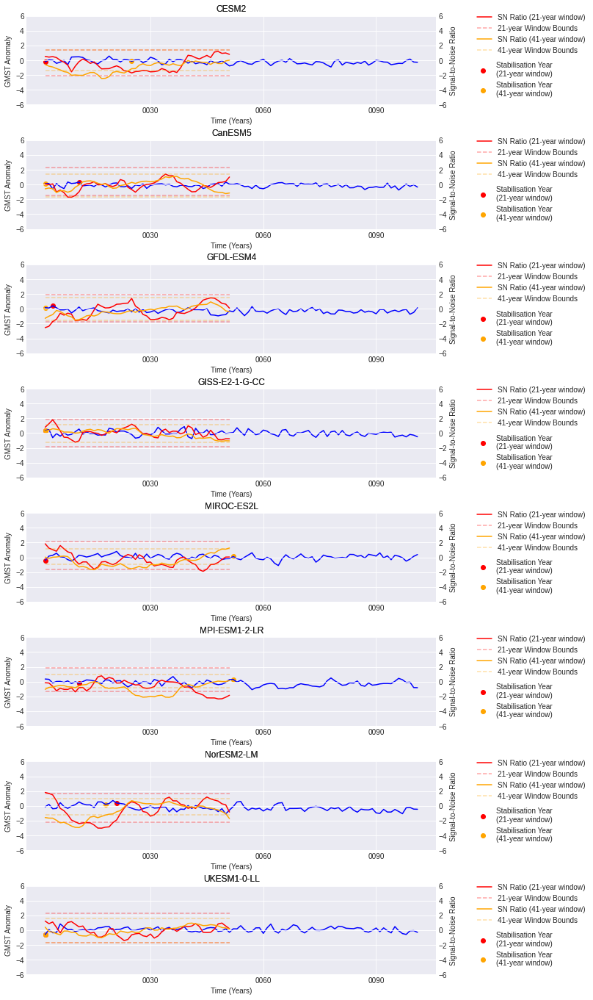

In [250]:
location = classes.locationsLatLon2.EASTERN_PACIFIC
fig = plot_lat_lon_value_and_sn(experiment_zec_da_anom, exp_local_sn_rolling_ds.isel(time=slice(None, 50)),
                          rolling_year_stable_local,location, step=2, vmax=6, vmax2=6)

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_zec_local_time_series_{location.name}.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

### Geo2D

In [277]:
rolling_year_stable_local.isel(window=0)

<xarray.Dataset>
Dimensions:   (lat: 96, lon: 192, model: 8, variable: 1)
Coordinates:
  * lat       (lat) float64 -88.57 -86.72 -84.86 -83.0 ... 84.86 86.72 88.57
  * lon       (lon) float64 0.0 1.875 3.75 5.625 7.5 ... 352.5 354.4 356.2 358.1
  * model     (model) object 'CESM2' 'CanESM5' ... 'NorESM2-LM' 'UKESM1-0-LL'
    window    int64 21
    height    float64 2.0
  * variable  (variable) <U15 'signal_to_noise'
Data variables:
    time      (variable, model, lat, lon) float64 dask.array<chunksize=(1, 8, 96, 192), meta=np.ndarray>

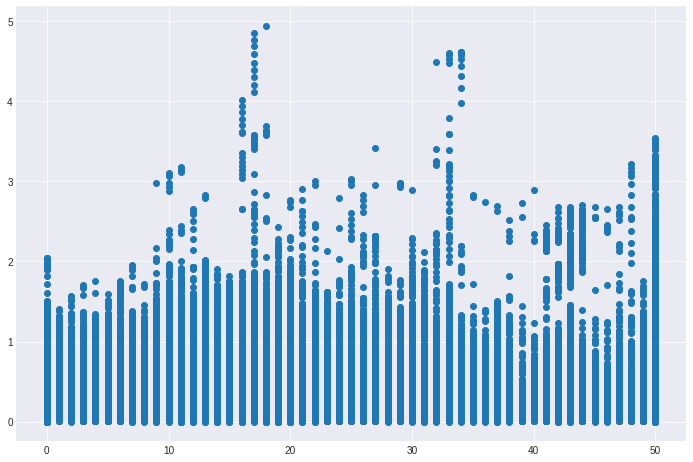

In [282]:
fig, ax =plt.subplots(figsize=(12,8))
plt.scatter(rolling_year_stable_local.sel(window=41).time.values.flatten(),
           np.abs(stable_anom_da.sel(window=41).values.flatten()))

In [251]:
max_effective_lenght = 100

GridSpec(2, 2, height_ratios=[1, 0.15])[1:2, 0:2]


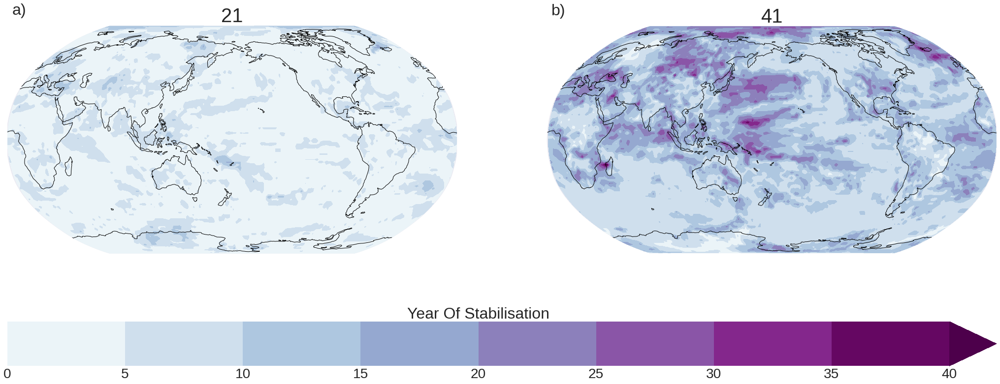

In [253]:
vm =40; step=5; levels_mean_stab= np.arange(0, vm+step, step)
fig = plt.figure(figsize=(18*2, 14))
fig, gs, axes = sn_plotting.map_plot_all_for_coords_2(
    rollling_year_stable_local_average['average_value'].squeeze(), dim='window', fig=fig,
    levels=levels_mean_stab, ncols=2, cmap='BuPu', extend='max',
    cbar_title="Year Of Stabilisation", font_scale=2)

GridSpec(2, 2, height_ratios=[1, 0.15])[1:2, 0:1]
GridSpec(2, 2, height_ratios=[1, 0.15])[1:2, 1:2]


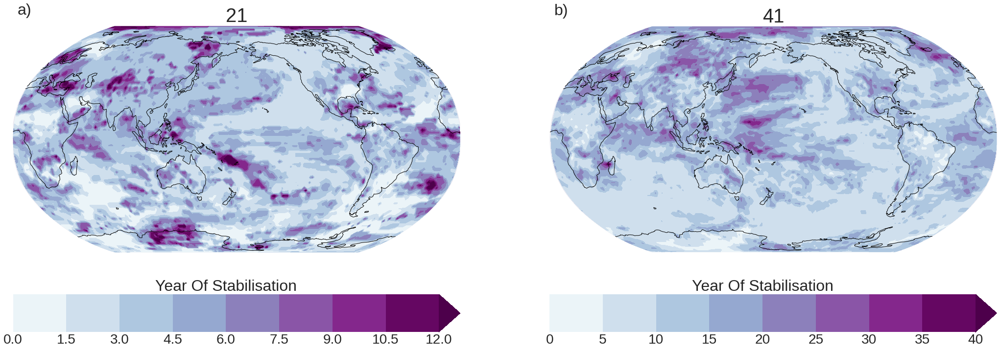

In [254]:
vm =40; step=5; levels_mean_stab2 = np.arange(0, vm+step, step)
vm =12; step=1.5; levels_mean_stab1 = np.arange(0, vm+step, step)

fig = plt.figure(figsize=(18*2, 12))
fig, gs, axes = sn_plotting.map_plot_all_for_coords_2(
    rollling_year_stable_local_average['average_value'].squeeze(), dim='window', fig=fig,
    levels=[levels_mean_stab1, levels_mean_stab2], ncols=2, extend='max', cmap='BuPu',
    cbar_title="Year Of Stabilisation", font_scale=2)

GridSpec(2, 2, height_ratios=[1, 0.15])[1:2, 0:1]
GridSpec(2, 2, height_ratios=[1, 0.15])[1:2, 1:2]
/home/563/ab2313/gdata/images/PhD/top_level/01_zec_stabilisation_uncertainty.png


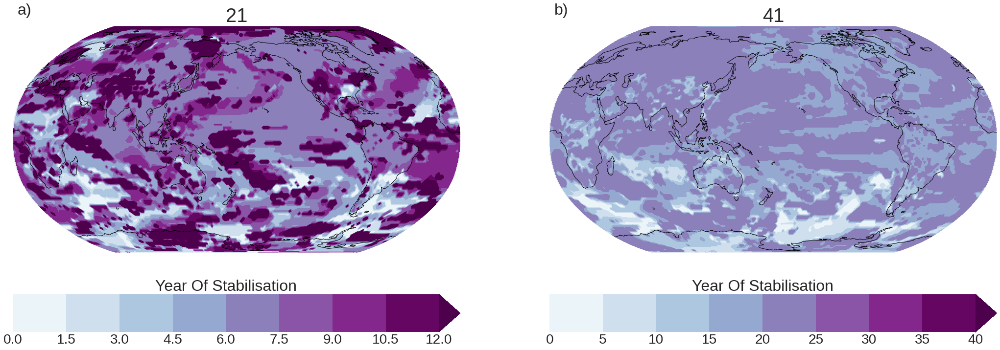

In [255]:
vm =40; step=5; levels_mean_stab2 = np.arange(0, vm+step, step)
vm =12; step=1.5; levels_mean_stab1 = np.arange(0, vm+step, step)

fig = plt.figure(figsize=(18*2, 12))
fig, gs, axes = sn_plotting.map_plot_all_for_coords_2(
    rollling_year_stable_local_average['uncertainty'].squeeze(), dim='window', fig=fig,
    levels=[levels_mean_stab1, levels_mean_stab2], ncols=2, cmap='BuPu', extend='max',
    cbar_title="Year Of Stabilisation", font_scale=2)


save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_zec_stabilisation_uncertainty.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

GridSpec(2, 2, height_ratios=[1, 0.15])[1:2, 0:2]


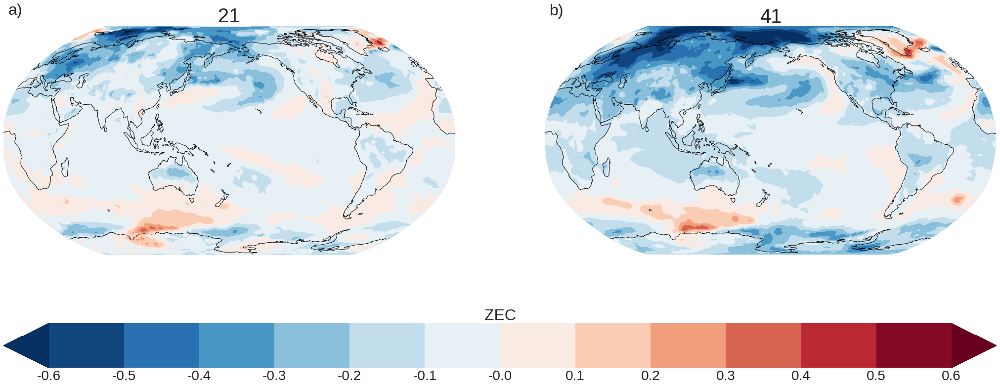

In [256]:
vm = .6; step=.1; levels_mean_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig = plt.figure(figsize=(18*2, 14))
fig, gs, axes = sn_plotting.map_plot_all_for_coords_2(
    stable_anom_da.mean(dim='model'), dim='window', fig=fig, levels=levels_mean_anom, ncols=2,
    cbar_title="ZEC", font_scale=2)

In [257]:
bounds_reformated = (exp_local_sn_rolling_ds.mean(dim='model')
     .squeeze()
     .drop('variable')[['upper_bound', 'lower_bound']]
     .to_array()
     .rename({'variable': 'bound'})).sel(bound=['lower_bound', 'upper_bound'])

GridSpec(3, 2, height_ratios=[1, 1, 0.2])[1:2, 0:2]
/home/563/ab2313/gdata/images/PhD/top_level/01_zec_mean_sn_bound.png


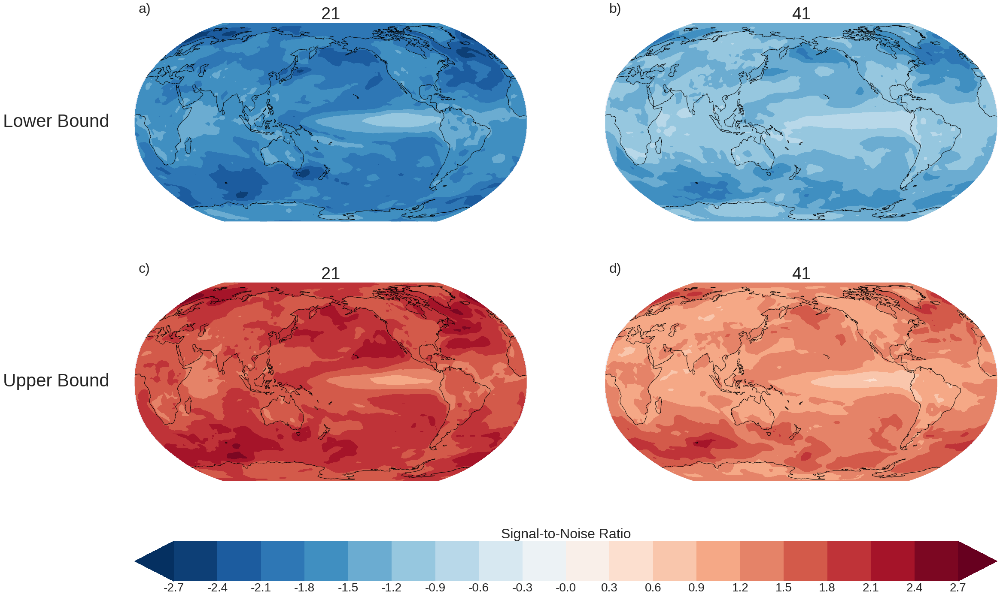

In [258]:
# All mean value plots
ntypes = 2

fig = plt.figure(figsize=(18*2, 12*ntypes))
gs = gridspec.GridSpec(3, 2, height_ratios = [1, 1, 0.2], hspace=0.4)
projection = ccrs.Robinson(central_longitude=int(np.mean(rollling_year_stable_local_average.lon.values)))

universaL_kwargs = dict(ncols=2, font_scale=2, add_label=False)
all_axes = []

bound = 2.7; step=0.3; signal_to_noise_levels = np.arange(-bound, bound+step, step)

fig, gs, axes = sn_plotting.map_plot_all_for_coords_2(
    bounds_reformated.sel(bound='lower_bound'), dim='window',
    levels=signal_to_noise_levels, cmap='RdBu_r',
    cbar_title="Signal-to-Noise Ratio",
    fig=fig, gs=gs,
    axes = [fig.add_subplot(gs[0, 0], projection=projection),
            fig.add_subplot(gs[0, 1], projection=projection)],
#     cax = [plt.subplot(gs[1, :])],
    add_colorbar=False,
    **universaL_kwargs)

all_axes.extend(axes)

fig, gs, axes = sn_plotting.map_plot_all_for_coords_2(
    bounds_reformated.sel(bound='upper_bound'), dim='window',
    levels=signal_to_noise_levels, cmap='RdBu_r',
    cbar_title="Signal-to-Noise Ratio",
    fig=fig, gs=gs,
    axes = [fig.add_subplot(gs[1, 0], projection=projection),
            fig.add_subplot(gs[1, 1], projection=projection)],
    cax = [plt.subplot(gs[2, :])],
    **universaL_kwargs)
all_axes.extend(axes)


y_axis_kwargs = dict(xy=(-0.2, 0.5), ha='center', va='center',
                     xycoords='axes fraction', rotation=0, size=21*universaL_kwargs['font_scale'])
row_labels = ['Lower Bound', 'Upper Bound']
for num, ax in enumerate(all_axes):
    plotting_functions.add_figure_label(ax, f'{chr(97+num)})', font_scale=universaL_kwargs['font_scale'])
    if num%2 == 0: ax.annotate(row_labels[int(num/2)], **y_axis_kwargs)
        
save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_zec_mean_sn_bound.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

GridSpec(2, 2, height_ratios=[1, 0.15])[1:2, 0:1]
GridSpec(2, 2, height_ratios=[1, 0.15])[1:2, 1:2]


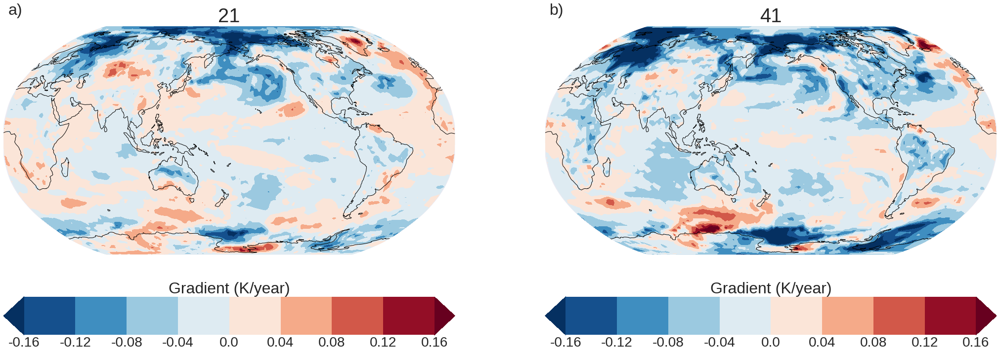

In [259]:
vm =.16; step=.04; levels_mean_stab2 = np.arange(-vm, vm+step, step)
vm =.16; step=.04; levels_mean_stab1 = np.arange(-vm, vm+step, step)

fig = plt.figure(figsize=(18*2, 12))
fig, gs, axes = sn_plotting.map_plot_all_for_coords_2(
    gradient_da.mean(dim='model').squeeze(), dim='window', fig=fig,
    levels=[levels_mean_stab1, levels_mean_stab2], ncols=2, cmap='RdBu_r', extend='both',
    cbar_title="Gradient (K/year)", font_scale=2)

GridSpec(6, 2, height_ratios=[1, 0.2, 1, 0.2, 1, 0.2])[1:2, 0:1]
GridSpec(6, 2, height_ratios=[1, 0.2, 1, 0.2, 1, 0.2])[1:2, 1:2]
GridSpec(6, 2, height_ratios=[1, 0.2, 1, 0.2, 1, 0.2])[1:2, 0:2]
GridSpec(6, 2, height_ratios=[1, 0.2, 1, 0.2, 1, 0.2])[1:2, 0:2]
/home/563/ab2313/gdata/images/PhD/top_level/01_zec_stabilisation_statistics.png


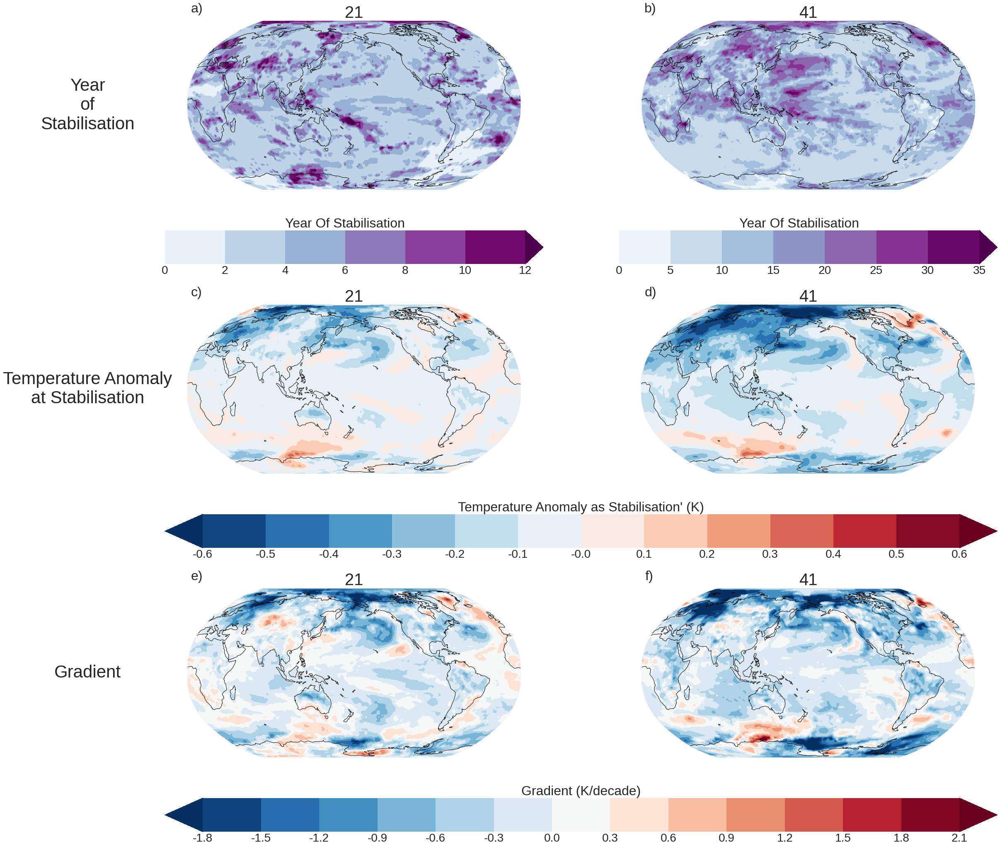

In [260]:
# All mean value plots
ntypes = 3

fig = plt.figure(figsize=(18*2, 12*ntypes))
gs = gridspec.GridSpec(ntypes*2, 2, height_ratios = [1, 0.2]*ntypes, hspace=0.4)
projection = ccrs.Robinson(central_longitude=int(np.mean(rollling_year_stable_local_average.lon.values)))

universaL_kwargs = dict(ncols=2, font_scale=2, add_label=False)
all_axes = []

vm =35; step=5; levels_mean_stab2 = np.arange(0, vm+step, step)
vm =12; step=2; levels_mean_stab1 = np.arange(0, vm+step, step)
fig, gs, axes = sn_plotting.map_plot_all_for_coords_2(
    rollling_year_stable_local_average['average_value'].squeeze(), dim='window',
    levels=[levels_mean_stab1, levels_mean_stab2], cmap='BuPu', extend='max',
    cbar_title="Year Of Stabilisation",
    fig=fig, gs=gs,
    axes = [fig.add_subplot(gs[0, 0], projection=projection),
            fig.add_subplot(gs[0, 1], projection=projection)],
    cax = [plt.subplot(gs[1, 0]), plt.subplot(gs[1, 1])],
    **universaL_kwargs)
all_axes.extend(axes)

vm = .6; step=.1; levels_mean_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes = sn_plotting.map_plot_all_for_coords_2(
    stable_anom_da.mean(dim='model'), dim='window', levels=levels_mean_anom, cbar_title="Temperature Anomaly as Stabilisation' (K)",
    fig=fig, gs=gs,
    axes = [fig.add_subplot(gs[2, 0], projection=projection),
            fig.add_subplot(gs[2, 1], projection=projection)],
    cax = [plt.subplot(gs[3, :])],
    **universaL_kwargs)
all_axes.extend(axes)


vm =.18; step=.03; levels_mean_grad = np.arange(-vm, vm+step, step)
fig, gs, axes = sn_plotting.map_plot_all_for_coords_2(
    gradient_da.mean(dim='model').squeeze()*10, dim='window',
    levels=levels_mean_grad*10, cmap='RdBu_r', extend='both', cbar_title="Gradient (K/decade)",
    fig=fig, gs=gs,
    axes = [fig.add_subplot(gs[4, 0], projection=projection),
            fig.add_subplot(gs[4, 1], projection=projection)],
    cax = [plt.subplot(gs[5, :])]#, plt.subplot(gs[5, 1])]
    , **universaL_kwargs)
all_axes.extend(axes)

y_axis_kwargs = dict(xy=(-0.3, 0.5), ha='center', va='center',
                     xycoords='axes fraction', rotation=0, size=21*universaL_kwargs['font_scale'])
row_labels = ['Year\nof\nStabilisation', 'Temperature Anomaly\nat Stabilisation', 'Gradient']
for num, ax in enumerate(all_axes):
    plotting_functions.add_figure_label(ax, f'{chr(97+num)})', font_scale=universaL_kwargs['font_scale'])
    if num%2 == 0: ax.annotate(row_labels[int(num/2)], **y_axis_kwargs)
        
save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_zec_stabilisation_statistics.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

GridSpec(4, 3, height_ratios=[1, 1, 1, 0.15])[3:4, 0:3]
/home/563/ab2313/gdata/images/PhD/top_level/01_zec_stabilisation_year_21_window.png


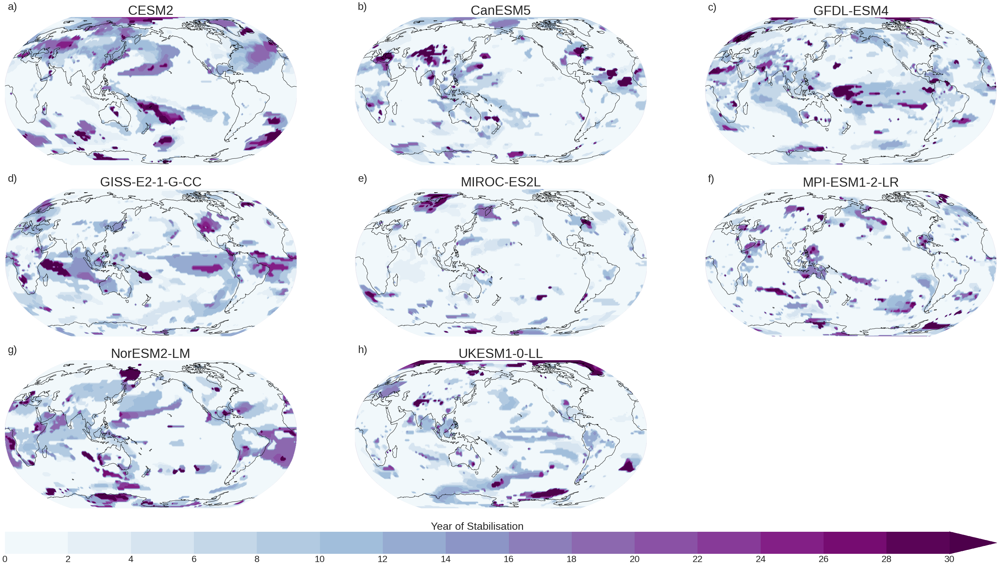

In [261]:
vm = 30; step=2; levels_stable = np.arange(0, vm+step, step) 
fig, gs, axes = sn_plotting.map_plot_all_for_coords_2(
    rolling_year_stable_local.sel(window=21).time.squeeze(),
    dim='model', levels=levels_stable, cmap='BuPu', extend='max',
    cbar_title="Year of Stabilisation", font_scale=2)

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_zec_stabilisation_year_21_window.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

GridSpec(4, 3, height_ratios=[1, 1, 1, 0.15])[3:4, 0:3]
/home/563/ab2313/gdata/images/PhD/top_level/01_zec_stabilisation_year_41_window.png


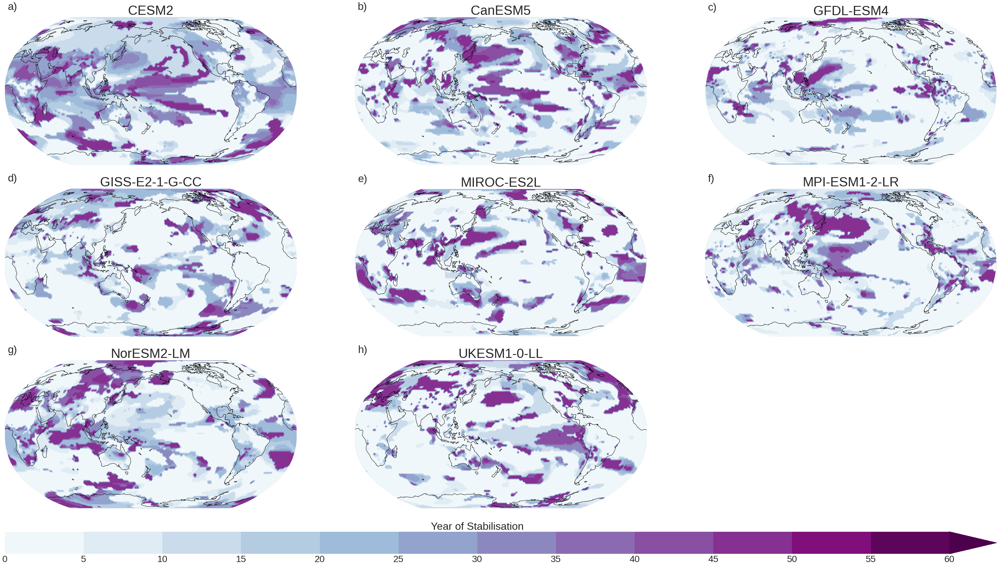

In [262]:
vm = 60; step=5; levels_stable = np.arange(0, vm+step, step) 
fig, gs, axes = sn_plotting.map_plot_all_for_coords_2(
    rolling_year_stable_local.sel(window=41).time.squeeze(),
    dim='model', levels=levels_stable, cmap='BuPu', extend='max',
    cbar_title="Year of Stabilisation", font_scale=2)


save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_zec_stabilisation_year_41_window.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

GridSpec(4, 3, height_ratios=[1, 1, 1, 0.15])[3:4, 0:3]
/home/563/ab2313/gdata/images/PhD/top_level/01_zec_at_stabilisation_21_window.png


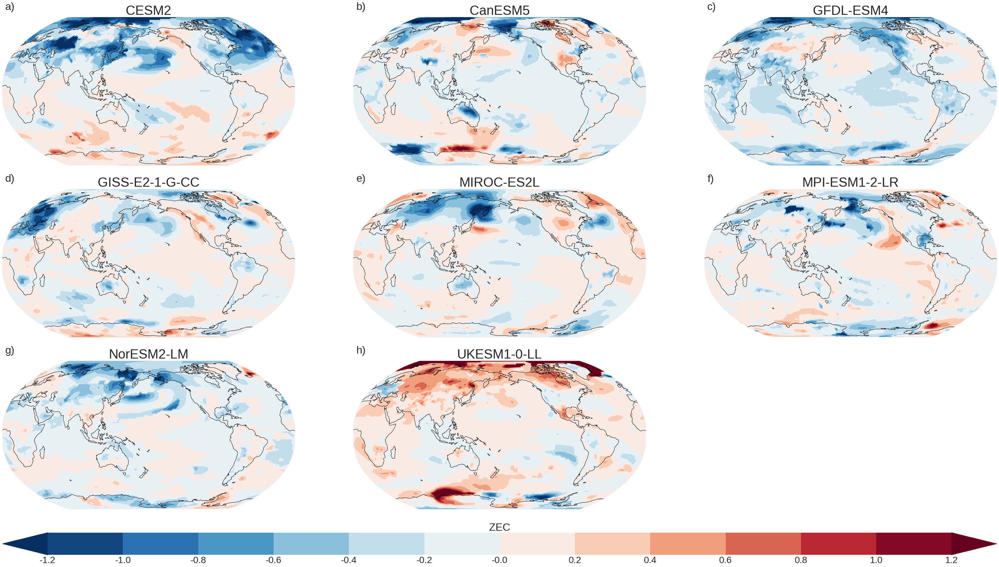

In [263]:
vm = 1.2; step=.2; levels_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes = sn_plotting.map_plot_all_for_coords_2(stable_anom_da.sel(window=21), dim='model',
                                                      levels=levels_anom, cbar_title="ZEC", font_scale=2)

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_zec_at_stabilisation_21_window.png')
print(save_name)
# fig.savefig(save_name, dpi=300, bbox_inches='tight')

GridSpec(4, 3, height_ratios=[1, 1, 1, 0.15])[3:4, 0:3]
/home/563/ab2313/gdata/images/PhD/top_level/01_zec_at_stabilisation_41_window.png


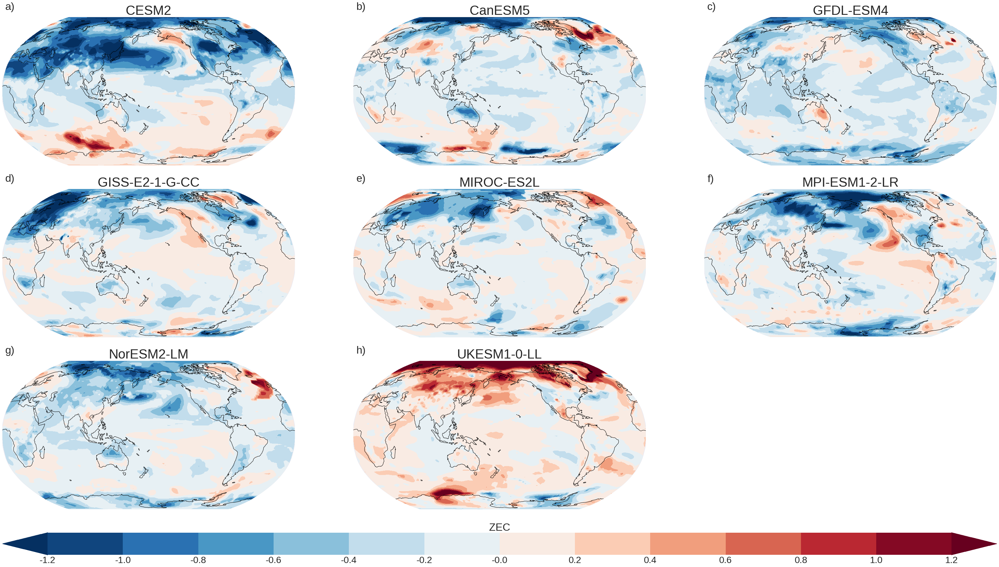

In [264]:
fig, gs, axes = sn_plotting.map_plot_all_for_coords_2(stable_anom_da.sel(window=41), dim='model', levels=levels_anom, 
                         cbar_title="ZEC", font_scale=2)

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_zec_at_stabilisation_41_window.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

GridSpec(4, 3, height_ratios=[1, 1, 1, 0.15])[3:4, 0:3]
/home/563/ab2313/gdata/images/PhD/top_level/01_zec_gradient_21_window.png


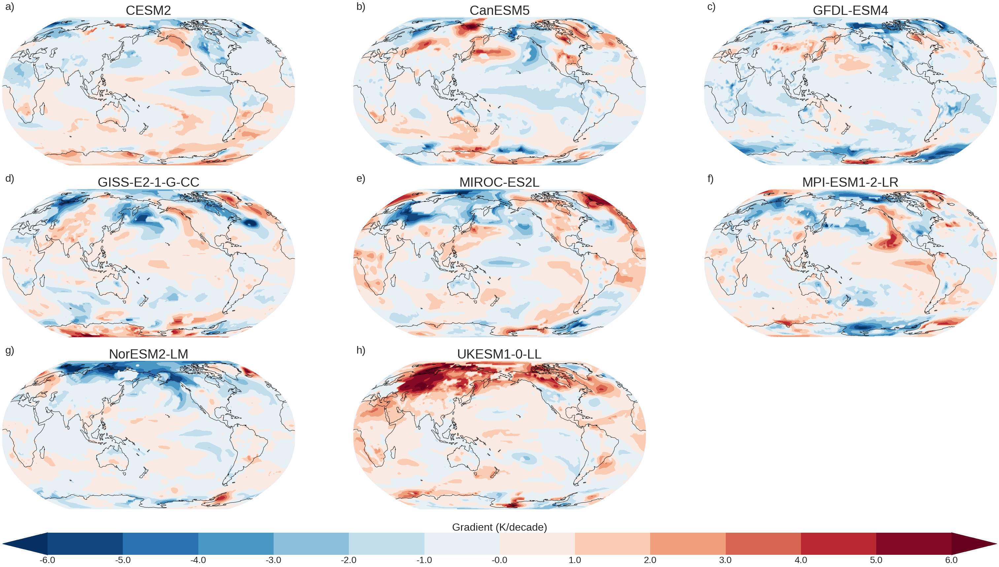

In [265]:
vm = .6; step=.1; levels_grad = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes = sn_plotting.map_plot_all_for_coords_2(gradient_da.sel(window=21)*10, dim='model',
                                                      levels=levels_grad*10, cbar_title="Gradient (K/decade)",
                                                      font_scale=2)

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_zec_gradient_21_window.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

GridSpec(4, 3, height_ratios=[1, 1, 1, 0.15])[3:4, 0:3]
/home/563/ab2313/gdata/images/PhD/top_level/01_zec_gradient_41_window.png


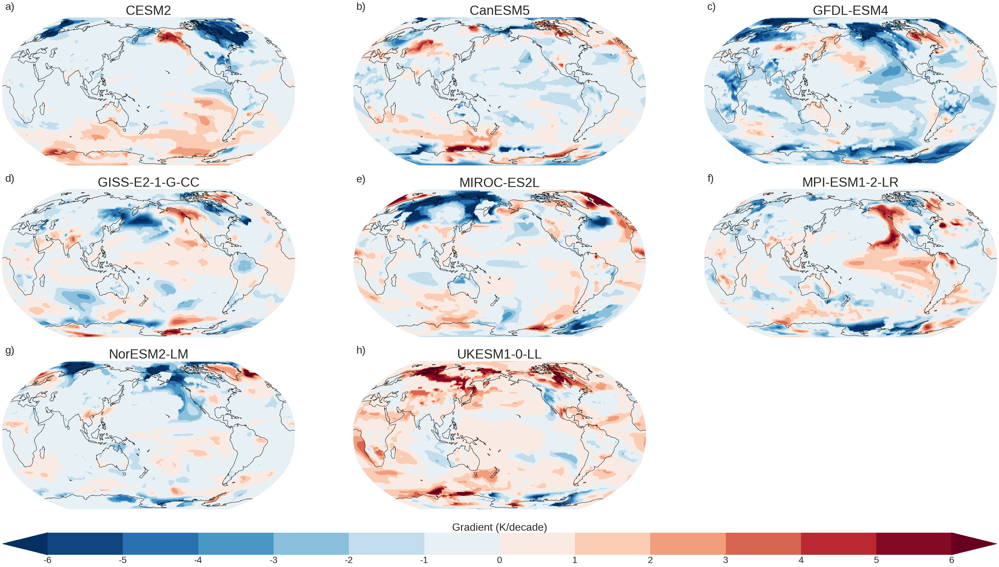

In [266]:
vm = 6; step=1; levels_grad = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes = sn_plotting.map_plot_all_for_coords_2(gradient_da.sel(window=41)*10, dim='model',
                                                      levels=levels_grad, cbar_title="Gradient (K/decade)",
                                                      font_scale=2)

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_zec_gradient_41_window.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

In [ ]:
# fig, axes, plots = sn_plotting.map_plot_all_for_coords(
#     rolling_year_stable_local, column_coord='window', row_coord='model', y=0.92,
#     variable=experiment_params['variable'], extend='max', cmap='Blues', vmin=0)

# save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
#                          f'{notebook_number}_all_model_year_of_stabilisation_rolling.png')
# print(save_name)
# fig.savefig(save_name, dpi=300, bbox_inches='tight')